In [2]:
from dateutil.parser import parse 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import holidays
plt.rcParams.update({'figure.figsize': (10, 7), 'figure.dpi': 120})

# Import as Dataframe
df_telephone = pd.read_csv('telephone.csv', parse_dates=['date_appel'],index_col='date_appel')
df_telephone = df_telephone.drop("id", axis=1)



In [2]:
df_telephone['nombre_entrants_corrige'] = df_telephone['nombre_entrants_corrige'].str.replace(',', '.').astype(float)


In [3]:
df_telephone.dtypes

entite                      object
famille                     object
nombre_entrants_corrige    float64
dtype: object

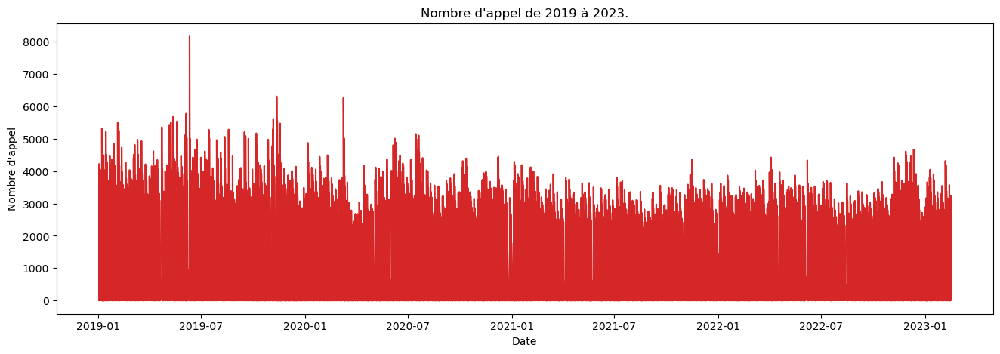

In [4]:
# Draw Plot
def plot_df(df, x, y, title="", xlabel='Date', ylabel="Nombre d'appel", dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

plot_df(df_telephone, x=df_telephone.index, y=df_telephone.nombre_entrants_corrige, title="Nombre d'appel de 2019 à 2023.")  

In [5]:
df_telephone2 = pd.read_csv('telephone.csv', parse_dates=['date_appel'])
df_telephone2['date_appel']= pd.to_datetime(df_telephone2['date_appel'])
df_telephone2 = df_telephone2.set_index('date_appel')
df_telephone2

,id,entite,famille,nombre_entrants_corrige
date_appel,,,,
2019-01-02,12,Entite 1,F2,165
2019-01-02,13,Entite 1,F3,54
2019-01-02,14,Entite 1,F4,1
2019-01-02,15,Entite 1,F5,99
2019-01-02,16,Entite 1,F6,1487
...,...,...,...,...
2023-02-15,23790,Entite 5,F2,"708,32971246"
2023-02-15,23791,Entite 5,F3,"738,93587571"
2023-02-15,23792,Entite 5,F5,"463,64218009"


In [6]:
df_telephone2['Annee'] = df_telephone2.index.year
df_telephone2['Mois'] = df_telephone2.index.month
df_telephone2['Jour'] = df_telephone2.index.day
df_telephone2['nom_jour'] = df_telephone2.index.day_name()
df_telephone2

,id,entite,famille,nombre_entrants_corrige,Annee,Mois,Jour,nom_jour
date_appel,,,,,,,,
2019-01-02,12,Entite 1,F2,165,2019,1,2,Wednesday
2019-01-02,13,Entite 1,F3,54,2019,1,2,Wednesday
2019-01-02,14,Entite 1,F4,1,2019,1,2,Wednesday
2019-01-02,15,Entite 1,F5,99,2019,1,2,Wednesday
2019-01-02,16,Entite 1,F6,1487,2019,1,2,Wednesday
...,...,...,...,...,...,...,...,...
2023-02-15,23790,Entite 5,F2,"708,32971246",2023,2,15,Wednesday
2023-02-15,23791,Entite 5,F3,"738,93587571",2023,2,15,Wednesday
2023-02-15,23792,Entite 5,F5,"463,64218009",2023,2,15,Wednesday


In [7]:
import holidays
import pandas as pd

annees = [2021, 2022]
jours_feries = []

# Enregistrez les dates des jours fériés dans une liste
for annee in annees:
    jours_feries_annee = holidays.France(years=annee)
    dates_annee = list(jours_feries_annee.keys())
    jours_feries.extend(dates_annee)

jours_feries = [pd.to_datetime(date) for date in jours_feries]

# Get the names of the holidays
noms_fetes = [holidays.France().get(date) for date in jours_feries]

# Create a DataFrame with the dates and corresponding holiday names
df_joursferies = pd.DataFrame({"jour_ferie": jours_feries, "nom_fete": noms_fetes})

# Print the DataFrame
print(df_joursferies)


   jour_ferie             nom_fete
0  2021-01-01         Jour de l'an
1  2021-05-01      Fête du Travail
2  2021-05-08  Fête de la Victoire
3  2021-07-14       Fête nationale
4  2021-11-11            Armistice
5  2021-04-05      Lundi de Pâques
6  2021-05-24   Lundi de Pentecôte
7  2021-05-13            Ascension
8  2021-08-15           Assomption
9  2021-11-01            Toussaint
10 2021-12-25                 Noël
11 2022-01-01         Jour de l'an
12 2022-05-01      Fête du Travail
13 2022-05-08  Fête de la Victoire
14 2022-07-14       Fête nationale
15 2022-11-11            Armistice
16 2022-04-18      Lundi de Pâques
17 2022-06-06   Lundi de Pentecôte
18 2022-05-26            Ascension
19 2022-08-15           Assomption
20 2022-11-01            Toussaint
21 2022-12-25                 Noël


In [ ]:
df_telephone2.loc()

In [8]:
import holidays
import pandas as pd

annees = [ 2019, 2020, 2021, 2022, 2023]
jours_feries = []

# Enregistrez les dates des jours fériés dans une liste
for annee in annees:
    jours_feries_annee = holidays.France(years=annee)
    dates_annee = list(jours_feries_annee.keys())
    jours_feries.extend(dates_annee)

jours_feries = [pd.to_datetime(date) for date in jours_feries]

lendemains_jours_feries = [date + pd.DateOffset(days=1) for date in jours_feries]
 
 



In [9]:
df_telephone2['jour_ferie'] = df_telephone2.index.isin(jours_feries)
df_telephone2['lendemain_jour_ferie'] = df_telephone2.index.isin(lendemains_jours_feries)
df_telephone2

,id,entite,famille,nombre_entrants_corrige,Annee,Mois,Jour,nom_jour,jour_ferie,lendemain_jour_ferie
date_appel,,,,,,,,,,
2019-01-02,12,Entite 1,F2,165,2019,1,2,Wednesday,False,True
2019-01-02,13,Entite 1,F3,54,2019,1,2,Wednesday,False,True
2019-01-02,14,Entite 1,F4,1,2019,1,2,Wednesday,False,True
2019-01-02,15,Entite 1,F5,99,2019,1,2,Wednesday,False,True
2019-01-02,16,Entite 1,F6,1487,2019,1,2,Wednesday,False,True
...,...,...,...,...,...,...,...,...,...,...
2023-02-15,23790,Entite 5,F2,"708,32971246",2023,2,15,Wednesday,False,False
2023-02-15,23791,Entite 5,F3,"738,93587571",2023,2,15,Wednesday,False,False
2023-02-15,23792,Entite 5,F5,"463,64218009",2023,2,15,Wednesday,False,False


In [10]:
df_telephone2 = df_telephone2.drop(["id"],axis =1)

In [11]:

df_joursferies = pd.DataFrame({"jour_ferie" : jours_feries})


In [12]:
df_joursferies["jour"] = pd.to_datetime(df_joursferies["jour_ferie"]).dt.day_name()
df_joursferies["annee"] = pd.to_datetime(df_joursferies["jour_ferie"]).dt.year

# Filter the DataFrame to include only the years 2021 and 2022
df_filtered = df_joursferies[df_joursferies["annee"].isin([2021, 2022])]

df_filtered["is_weekend"] = df_filtered.jour.isin(["Saturday","Sunday"])
df_filtered

/tmp/ipykernel_45342/1841610318.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["is_weekend"] = df_filtered.jour.isin(["Saturday","Sunday"])


,jour_ferie,jour,annee,is_weekend
22,2021-01-01,Friday,2021,False
23,2021-05-01,Saturday,2021,True
24,2021-05-08,Saturday,2021,True
25,2021-07-14,Wednesday,2021,False
26,2021-11-11,Thursday,2021,False
27,2021-04-05,Monday,2021,False
28,2021-05-24,Monday,2021,False
29,2021-05-13,Thursday,2021,False
30,2021-08-15,Sunday,2021,True
31,2021-11-01,Monday,2021,False


In [13]:
df_telephone2.loc["2021":]

,entite,famille,nombre_entrants_corrige,Annee,Mois,Jour,nom_jour,jour_ferie,lendemain_jour_ferie
date_appel,,,,,,,,,
2021-01-02,Entite 1,F2,"13,2",2021,1,2,Saturday,False,True
2021-01-02,Entite 1,F3,"79,056748911",2021,1,2,Saturday,False,True
2021-01-02,Entite 1,F5,"5,9016393443",2021,1,2,Saturday,False,True
2021-01-02,Entite 1,F6,"200,87058824",2021,1,2,Saturday,False,True
2021-01-02,Entite 1,F7,"71,377777778",2021,1,2,Saturday,False,True
...,...,...,...,...,...,...,...,...,...
2023-02-15,Entite 5,F2,"708,32971246",2023,2,15,Wednesday,False,False
2023-02-15,Entite 5,F3,"738,93587571",2023,2,15,Wednesday,False,False
2023-02-15,Entite 5,F5,"463,64218009",2023,2,15,Wednesday,False,False


In [14]:
df_telephone2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 23783 entries, 2019-01-02 to 2023-02-15
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   entite                   23783 non-null  object
 1   famille                  23783 non-null  object
 2   nombre_entrants_corrige  23783 non-null  object
 3   Annee                    23783 non-null  int64 
 4   Mois                     23783 non-null  int64 
 5   Jour                     23783 non-null  int64 
 6   nom_jour                 23783 non-null  object
 7   jour_ferie               23783 non-null  bool  
 8   lendemain_jour_ferie     23783 non-null  bool  
dtypes: bool(2), int64(3), object(4)
memory usage: 2.0+ MB


In [15]:
df_telephone2['nombre_entrants_corrige'] = df_telephone2['nombre_entrants_corrige'].str.replace(',', '.').astype(float)


In [16]:
df_group_jour = df_telephone2.groupby(['entite','nom_jour']).sum('nombre_entrants_corrige').drop(['Annee','Mois','Jour','jour_ferie','lendemain_jour_ferie'],axis=1)
df_group_jour = df_group_jour.reset_index()

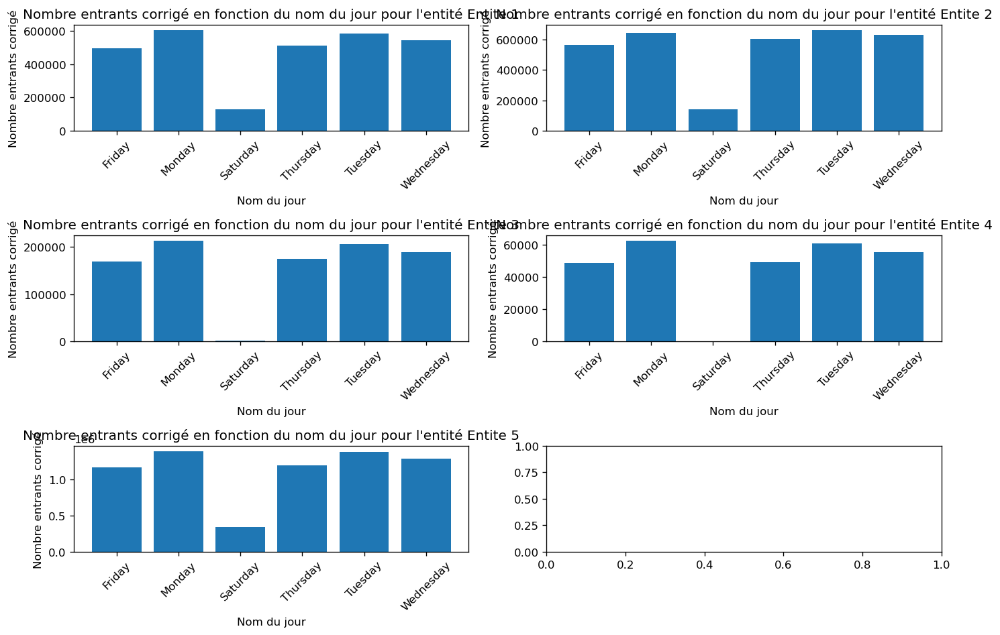

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Supposons que vous ayez un DataFrame groupé par entité et nom_jour appelé "df_group_jour"
# avec les colonnes "entite", "nom_jour" et "nombre_entrants_corrige"

# Obtenir le nombre total d'entités
num_entites = len(df_group_jour['entite'].unique())

# Déterminer le nombre de lignes et de colonnes pour les subplots
num_lignes = int(num_entites / 2) + num_entites % 2
num_colonnes = 2

# Créer la figure et les subplots
fig, axes = plt.subplots(num_lignes, num_colonnes, figsize=(12, 8))

# Parcourir chaque entité et créer un subplot séparé
for i, (entite, data_entite) in enumerate(df_group_jour.groupby('entite')):
    # Calculer les indices de ligne et de colonne pour le subplot
    ligne = i // num_colonnes
    colonne = i % num_colonnes

    # Sélectionner l'axe correspondant au subplot
    if num_lignes > 1:
        axe = axes[ligne, colonne]
    else:
        axe = axes[colonne]

    # Extraire les données spécifiques à l'entité
    jours = data_entite['nom_jour']
    nombre_entrants_corrige = data_entite['nombre_entrants_corrige']

    # Tracer le graphique à barres
    axe.bar(jours, nombre_entrants_corrige)

    # Ajouter des labels et des titres
    axe.set_xlabel('Nom du jour')
    axe.set_ylabel('Nombre entrants corrigé')
    axe.set_title('Nombre entrants corrigé en fonction du nom du jour pour l\'entité {}'.format(entite))

    # Faire pivoter les étiquettes des jours pour une meilleure lisibilité
    axe.set_xticks(range(len(jours)))  # Définir les emplacements des étiquettes
    axe.set_xticklabels(jours, rotation=45)

# Ajuster l'espacement entre les subplots
plt.tight_layout()

# Afficher la figure avec les subplots
plt.show()


In [18]:
df_group_jour_famille = df_telephone2.groupby(['famille','nom_jour']).sum('nombre_entrants_corrige').drop(['Annee','Mois','Jour','jour_ferie','lendemain_jour_ferie'],axis=1)
df_group_jour_famille = df_group_jour_famille.reset_index()


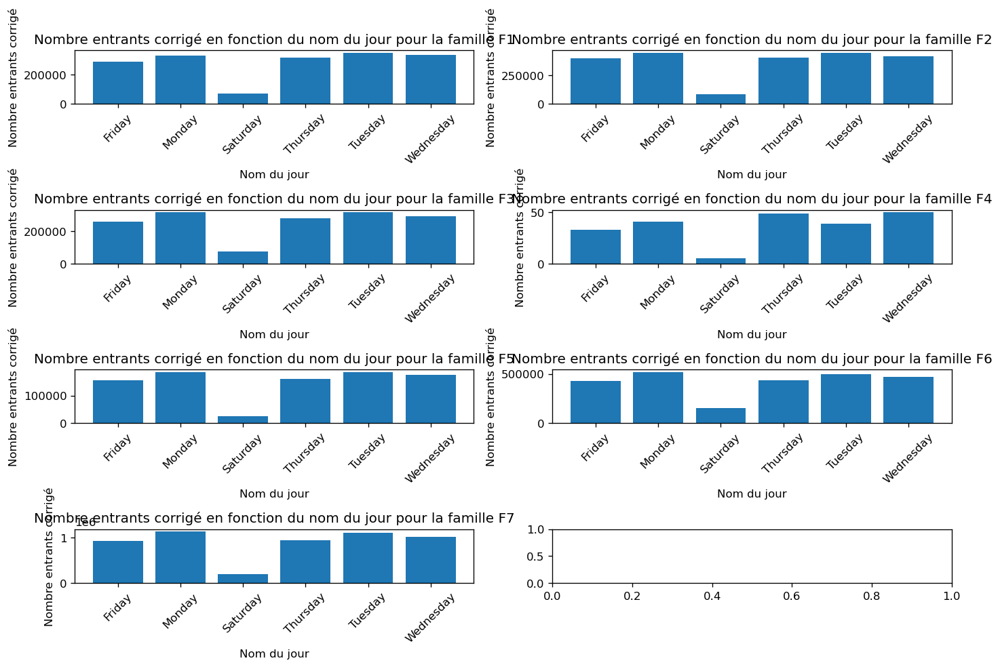

In [19]:
# Obtenir le nombre total d'entités
num_famille = len(df_group_jour_famille['famille'].unique())

# Déterminer le nombre de lignes et de colonnes pour les subplots
num_lignes = int(num_famille / 2) + num_famille % 2
num_colonnes = 2

# Créer la figure et les subplots
fig, axes = plt.subplots(num_lignes, num_colonnes, figsize=(12, 8))

# Parcourir chaque entité et créer un subplot séparé
for i, (famille, data_famille) in enumerate(df_group_jour_famille.groupby('famille')):
    # Calculer les indices de ligne et de colonne pour le subplot
    ligne = i // num_colonnes
    colonne = i % num_colonnes

    # Sélectionner l'axe correspondant au subplot
    if num_lignes > 1:
        axe = axes[ligne, colonne]
    else:
        axe = axes[colonne]

    # Extraire les données spécifiques à l'entité
    jours = data_famille['nom_jour']
    nombre_entrants_corrige = data_famille['nombre_entrants_corrige']

    # Tracer le graphique à barres
    axe.bar(jours, nombre_entrants_corrige)

    # Ajouter des labels et des titres
    axe.set_xlabel('Nom du jour')
    axe.set_ylabel('Nombre entrants corrigé')
    axe.set_title('Nombre entrants corrigé en fonction du nom du jour pour la famille {}'.format(famille))

    # Faire pivoter les étiquettes des jours pour une meilleure lisibilité
    axe.set_xticks(range(len(jours)))  # Définir les emplacements des étiquettes
    axe.set_xticklabels(jours, rotation=45)

# Ajuster l'espacement entre les subplots
plt.tight_layout()

# Afficher la figure avec les subplots
plt.show()


In [20]:
df_group_jour_famille_entite = df_telephone2.groupby(['famille','entite','nom_jour']).sum('nombre_entrants_corrige').drop(['Annee','Mois','Jour','jour_ferie','lendemain_jour_ferie'],axis=1)
df_group_jour_famille_entite= df_group_jour_famille_entite.reset_index()

# Concaténer les colonnes "entité" et "famille" en une seule colonne "entite_famille"
df_group_jour_famille_entite['entite_famille'] = df_group_jour_famille_entite['entite'].str.cat(df_group_jour_famille_entite['famille'], sep=' - ')
df_group_jour_famille_entite

,famille,entite,nom_jour,nombre_entrants_corrige,entite_famille
0,F1,Entite 1,Friday,775.023668,Entite 1 - F1
1,F1,Entite 1,Monday,884.135018,Entite 1 - F1
2,F1,Entite 1,Saturday,90.200000,Entite 1 - F1
3,F1,Entite 1,Thursday,798.183333,Entite 1 - F1
4,F1,Entite 1,Tuesday,930.265238,Entite 1 - F1
...,...,...,...,...,...
130,F7,Entite 5,Monday,780160.889243,Entite 5 - F7
131,F7,Entite 5,Saturday,163987.765116,Entite 5 - F7
132,F7,Entite 5,Thursday,662670.825607,Entite 5 - F7
133,F7,Entite 5,Tuesday,769329.406545,Entite 5 - F7


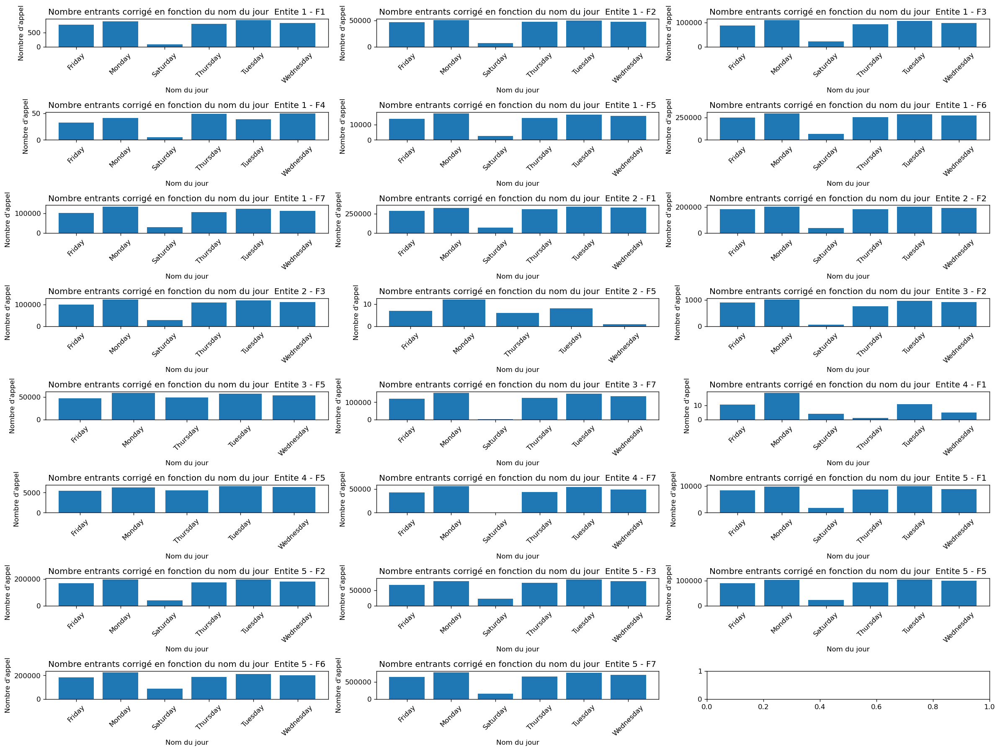

In [31]:
# Obtenir le nombre total d'entités
num_famille_entite = len(df_group_jour_famille_entite['entite_famille'].unique())

# Déterminer le nombre de lignes et de colonnes pour les subplots
num_lignes = 8
num_colonnes = 3

# Créer la figure et les subplots avec une taille réduite
fig, axes = plt.subplots(num_lignes, num_colonnes, figsize=(20, 15))

# Parcourir chaque entité et créer un subplot séparé
for i, (entite_famille, data_famille_entite) in enumerate(df_group_jour_famille_entite.groupby('entite_famille')):
    # Calculer les indices de ligne et de colonne pour le subplot
    ligne = i // num_colonnes
    colonne = i % num_colonnes

    # Sélectionner l'axe correspondant au subplot
    if num_lignes > 1:
        axe = axes[ligne, colonne]
    else:
        axe = axes[colonne]

    # Extraire les données spécifiques à l'entité
    jours = data_famille_entite['nom_jour'].sort_values()
    nombre_entrants_corrige = data_famille_entite['nombre_entrants_corrige']

    # Tracer le graphique à barres
    axe.bar(jours, nombre_entrants_corrige)

    # Faire pivoter les étiquettes des jours pour une meilleure lisibilité
    axe.set_xticks(range(len(jours)))  # Définir les emplacements des étiquettes
    axe.set_xticklabels(jours, rotation=45)

    # Ajouter des labels et des titres
    axe.set_xlabel('Nom du jour')
    axe.set_ylabel("Nombre d'appel")
    axe.set_title('Nombre entrants corrigé en fonction du nom du jour  {}'.format(entite_famille))

# Ajuster l'espacement entre les subplots
plt.tight_layout()

# Afficher la figure avec les subplots
plt.show()




In [ ]:
df_telephone2 = df_telephone2.loc["2021":]

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Déterminer le nombre de lignes et de colonnes pour les subplots
num_lignes = 12
num_colonnes = 2

# Créer la figure et les subplots
fig, ax = plt.subplots(num_lignes, num_colonnes, figsize=(100, 100))

# Parcourir chaque famille_entite et créer un graphique séparé
for i, (famille_entite, data_famille_entite) in enumerate(df_telephone2.groupby(['famille', 'entite'])):
    ligne = i // num_colonnes
    colonne = i % num_colonnes

    # Sélectionner l'axe correspondant au subplot
    if num_lignes > 1:
        axe = ax[ligne, colonne]
    else:
        axe = ax[colonne]

    # Extraire les données spécifiques à la famille_entite
    dates = data_famille_entite.index
    nombre_appel = data_famille_entite['nombre_entrants_corrige']
    jour_feries = data_famille_entite[data_famille_entite['lendemain_jour_ferie']].index

    # Tracer la courbe
    axe.plot(dates, nombre_appel)

    # Ajouter des lignes verticales pour les jours feries
    for jour_ferie in jour_feries:
        axe.axvline(x=jour_ferie, color='red', linestyle='-')

    # Ajouter des labels et des titres
    axe.set_xlabel('Dates', fontsize=30)
    axe.set_ylabel('Nombre d\'appels', fontsize=30)
    axe.set_title("Nombre d'appels pour la famille {} et l'entité {}".format(famille_entite[0], famille_entite[1]), fontsize=50)

    # Faire pivoter les étiquettes des dates pour une meilleure lisibilité
    axe.tick_params(axis='x', rotation=45, labelsize=30)
    axe.tick_params(axis='y', labelsize=30)

# Ajuster l'espacement entre les subplots
plt.tight_layout()

# Afficher le graphique
plt.show()


In [4]:
df_test = pd.read_csv("df_test_ADF_KPSS.csv")
df_test

,Entite,Famille,ADF,KPSS
0,Entite 1,F2,peut pas dire,peut pas dire
1,Entite 2,F2,peut pas dire,peut pas dire
2,Entite 3,F2,Non stationnaire,Trend Stationnaire
3,Entite 5,F2,peut pas dire,peut pas dire
4,Entite 4,F2,empty,empty
5,Entite 1,F3,Non stationnaire,Trend Stationnaire
6,Entite 2,F3,Non stationnaire,peut pas dire
7,Entite 3,F3,empty,empty
8,Entite 5,F3,Non stationnaire,peut pas dire
9,Entite 4,F3,empty,empty


In [6]:


# Supprimer les lignes avec les valeurs indésirables
df_test = df_test[~((df_test['ADF'] == 'peut pas dire') | (df_test['ADF'] == 'empty'))]
df_test = df_test[~((df_test['KPSS'] == 'peut pas dire') | (df_test['KPSS'] == 'empty'))]

print(df_test)


      Entite Famille               ADF                KPSS
2   Entite 3      F2  Non stationnaire  Trend Stationnaire
5   Entite 1      F3  Non stationnaire  Trend Stationnaire
15  Entite 1      F6  Non stationnaire  Trend Stationnaire
23  Entite 5      F7  Non stationnaire  Trend Stationnaire
29  Entite 4      F1  Non stationnaire  Trend Stationnaire
30  Entite 1      F4  Non stationnaire  Trend Stationnaire


In [8]:


# Créer un DataFrame à partir des résultats
df_results = pd.DataFrame(results, columns=['famille', 'entite', 'stationnaire'])

# Afficher le tableau
print(df_results)


Empty DataFrame
Columns: [famille, entite, stationnaire]
Index: []
